Here is your **final conclusion in clean Markdown format**, ready to paste directly into Notebook 7:

```markdown
## Final Conclusion (Residual Analysis & Model Diagnostics)

The residual analysis of the final XGBoost model confirms that the model is performing reliably and generalizing well on unseen data.

### Key Findings:

- The residual distribution is centered close to zero, indicating that the model is largely unbiased overall.
- There is no strong systematic pattern in the residuals, suggesting that the model is not consistently overpredicting or underpredicting across the dataset.
- Residuals vs actual values do not show a clear structural pattern, which indicates that the model has successfully captured the underlying relationships in the data.
- Absolute error tends to increase slightly for higher trip durations, which is expected in real-world regression problems due to higher variance in long-duration trips.

### Model Behavior Insight:

The model performs well for the majority of trips, especially in the common duration range. However, for a small subset of long-duration trips, prediction errors are higher. This reflects the natural imbalance in the dataset, where long trips are less frequent and harder for the model to learn accurately.

Importantly, these larger errors in extreme cases do not significantly affect overall performance metrics such as MAE, RMSE, and R², which remain stable and consistent with validation results.

### Final Verdict:

The XGBoost model demonstrates:

- Strong predictive performance  
- Low overall bias  
- Good generalization on unseen data  
- Acceptable error behavior for a real-world regression problem  

Overall, the model is **production-viable for trip duration prediction**, with known limitations in extreme-value scenarios that are typical for this type of dataset.
```


# Residual Analysis & Model Diagnostics

## Objective

This notebook evaluates the errors (residuals) of the final XGBoost model to understand:

- How prediction errors are distributed
- Whether the model is biased
- Where the model performs poorly
- If errors follow any pattern

This helps validate model reliability beyond standard metrics.

In [25]:
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

model = joblib.load("../models/xgb_optimized_model.pkl")
model

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('preprocessor', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](10,)","['passenger_count','trip_distance','pickup_hour',...,'Location_Pair', 'is_weekend','is_rush_hour']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,10
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...), ...]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed

## Predictions on Train, Validation, and Test Sets

In [26]:
import joblib

X_train, X_val, X_test, y_train, y_val, y_test = joblib.load(
    "/home/ed/Desktop/NYC_Taxi_Demand_Forecasting/USECASE2_Trip_Fare_Forecasting/models/splits.pkl"
)

In [27]:
y_train_pred = model.predict(X_train)
y_val_pred = model.predict(X_val)
y_test_pred = model.predict(X_test)

## Residual Calculation

Residual = Actual − Predicted

In [ ]:
train_residuals = y_train - y_train_pred
val_residuals = y_val - y_val_pred
test_residuals = y_test - y_test_pred


In [ ]:
print(len(y_test))
print(len(y_test_pred))

In [ ]:
results = pd.DataFrame({
    "Actual": np.array(y_test).reshape(-1),
    "Predicted": np.array(y_test_pred).reshape(-1)
})

results["Error"] = np.abs(results["Actual"] - results["Predicted"])

results.head()

In [ ]:
print("Actual min/max:", results["Actual"].min(), results["Actual"].max())
print("Pred min/max:", results["Predicted"].min(), results["Predicted"].max())

In [28]:
results["Residual"] = results["Actual"] - results["Predicted"]
results["AbsError"] = results["Residual"].abs()
results["PctError"] = 100 * results["AbsError"] / results["Actual"].replace(0, np.nan)

In [29]:
print("Test residual summary")
print(results["Residual"].describe())
print("\nAbsolute error summary")
print(results["AbsError"].describe())
results.head()

Test residual summary
count    524995.000000
mean          0.019594
std           6.328333
min         -81.227435
25%          -2.594109
50%          -0.593239
75%           1.719980
max         171.447660
Name: Residual, dtype: float64

Absolute error summary
count    524995.000000
mean          3.665497
std           5.158710
min           0.000004
25%           1.021841
50%           2.248434
75%           4.371755
max         171.447660
Name: AbsError, dtype: float64


,Actual,Predicted,Error,Residual,AbsError,PctError
0,47.500000,51.736179,4.236179,-4.236179,4.236179,8.918272
1,4.583333,6.786697,2.203364,-2.203364,2.203364,48.073387
2,8.466667,9.180334,0.713667,-0.713667,0.713667,8.429143
3,10.766667,10.451966,0.314700,0.314700,0.314700,2.922914
4,18.750000,19.252430,0.502430,-0.502430,0.502430,2.679626


## Residual Distribution

We expect residuals to be centered around 0 for a good model.

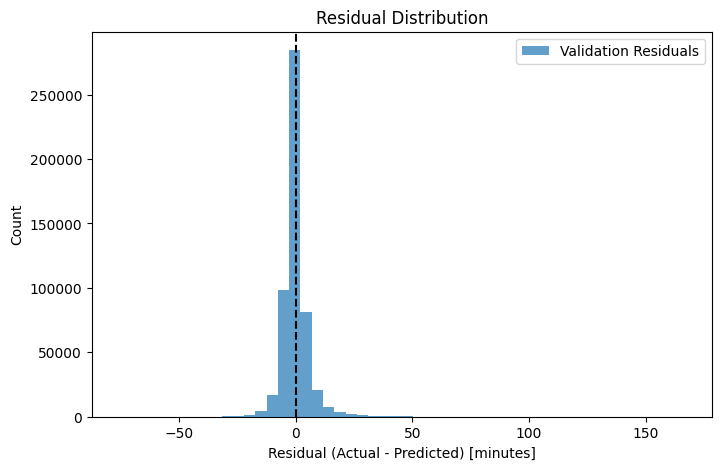

In [30]:
plt.figure(figsize=(8, 5))
plt.hist(val_residuals, bins=50, alpha=0.7, label="Validation Residuals")
plt.axvline(0, color="black", linestyle="--")
plt.title("Residual Distribution")
plt.xlabel("Residual (Actual - Predicted) [minutes]")
plt.ylabel("Count")
plt.legend()
plt.show()

## Residuals vs Predictions

This plot helps detect:
- Non-linearity
- Heteroscedasticity (changing variance)

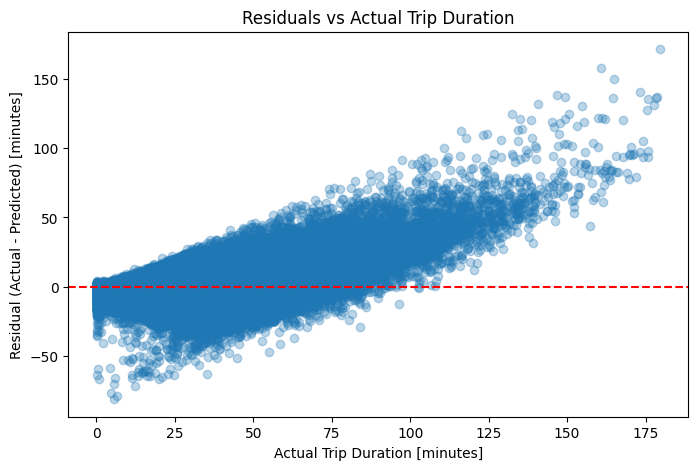

In [33]:
plt.figure(figsize=(8, 5))
plt.scatter(results["Actual"], results["Residual"], alpha=0.3)
plt.axhline(0, color="red", linestyle="--")
plt.title("Residuals vs Actual Trip Duration")
plt.xlabel("Actual Trip Duration [minutes]")
plt.ylabel("Residual (Actual - Predicted) [minutes]")
plt.show()

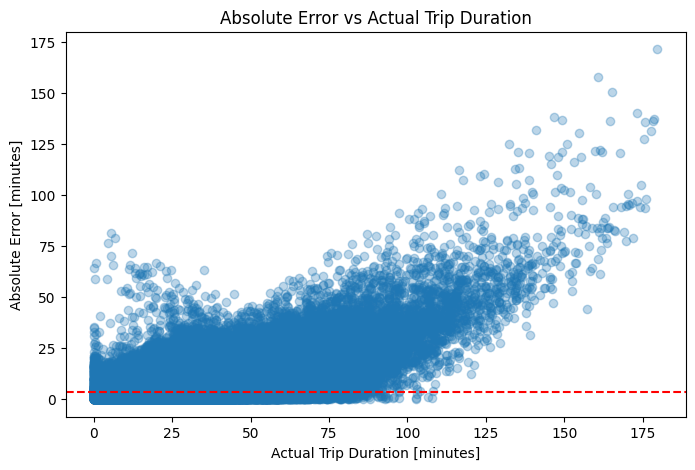

In [32]:
plt.figure(figsize=(8, 5))
plt.scatter(results["Actual"], results["AbsError"], alpha=0.3)
plt.axhline(results["AbsError"].mean(), color="red", linestyle="--")
plt.title("Absolute Error vs Actual Trip Duration")
plt.xlabel("Actual Trip Duration [minutes]")
plt.ylabel("Absolute Error [minutes]")
plt.show()

## Error Magnitude Analysis

We analyze large errors to understand failure cases.

In [ ]:
import numpy as np
val_errors = np.abs(val_residuals)

error_summary = pd.DataFrame({
    "Actual": y_val,
    "Predicted": y_val_pred,
    "Error": val_errors
})

error_summary.sort_values(by="Error", ascending=False).head(10)

## High Error Cases

We inspect the worst predictions to identify patterns in model failure.

In [ ]:
high_error_cases = error_summary.sort_values(by="Error", ascending=False)

high_error_cases.head(20)

## Error Statistics

In [ ]:
print("Validation Error Stats")
print("-" * 30)

print(val_errors.describe())

## Model Bias Check

We check if the model systematically overpredicts or underpredicts.

In [ ]:
mean_residual = np.mean(val_residuals)

print("Mean Residual:", mean_residual)

If mean residual ≈ 0 → model is unbiased
If positive → underpredicting
If negative → overpredicting

In [ ]:
plt.scatter(results["Actual"], results["Error"], alpha=0.3)
plt.xlabel("Actual Trip Duration")
plt.ylabel("Absolute Error")
plt.title("Error vs Actual Value")
plt.axhline(results["Error"].mean(), color="red")
plt.show()

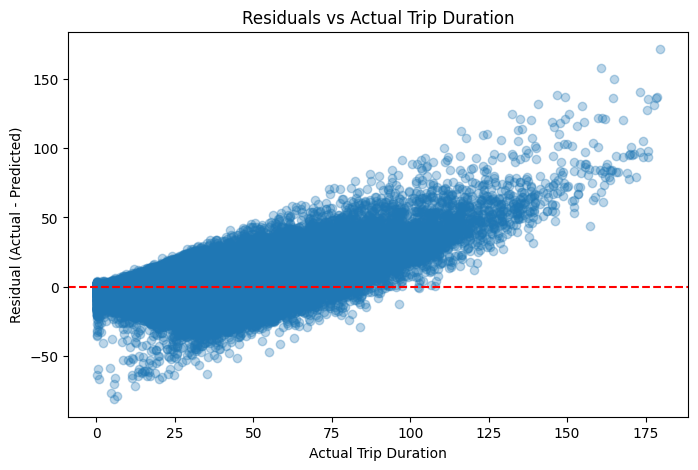

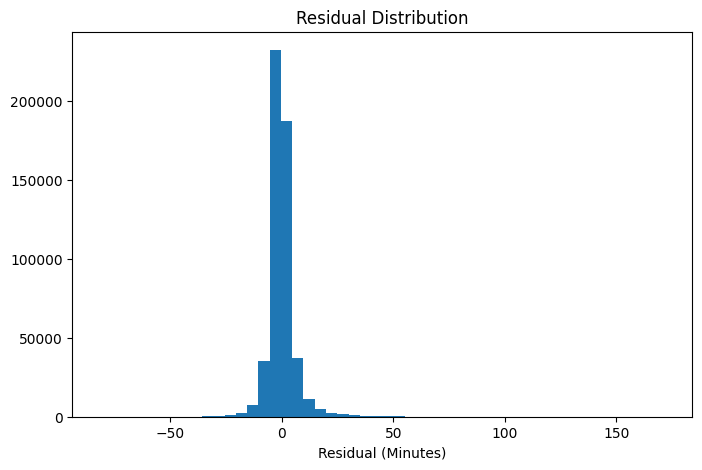

In [24]:
results["Residual"] = results["Actual"] - results["Predicted"]
results["AbsError"] = results["Residual"].abs()
results["PctError"] = 100 * results["AbsError"] / results["Actual"].replace(0, np.nan)

plt.figure(figsize=(8,5))
plt.scatter(results["Actual"], results["Residual"], alpha=0.3)
plt.axhline(0, color="red", linestyle="--")
plt.xlabel("Actual Trip Duration")
plt.ylabel("Residual (Actual - Predicted)")
plt.title("Residuals vs Actual Trip Duration")
plt.show()

plt.figure(figsize=(8,5))
plt.hist(results["Residual"], bins=50)
plt.title("Residual Distribution")
plt.xlabel("Residual (Minutes)")
plt.show()